In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
import os

folder_path = '/content/gdrive/MyDrive/MedicalPaper'
os.makedirs(folder_path, exist_ok=True)


In [3]:
cd /content/gdrive/MyDrive/MedicalPaper

/content/gdrive/MyDrive/MedicalPaper


#Image Classification part

Path to dataset files: /kaggle/input/oral-diseases
Caries: Found 2382 images.
Gingivitis: Found 2340 images.
Ulcers: Found 2541 images.
Tooth Discoloration: Found 1834 images.
Hypodontia: Found 342 images.

Images have been copied and organized successfully.

Number of images per class:

Caries:
  Train: 1714
  Val:   429
  Test:  239

Gingivitis:
  Train: 1684
  Val:   422
  Test:  234

Ulcers:
  Train: 1828
  Val:   458
  Test:  255

Tooth Discoloration:
  Train: 1320
  Val:   330
  Test:  184

Hypodontia:
  Train: 245
  Val:   62
  Test:  35


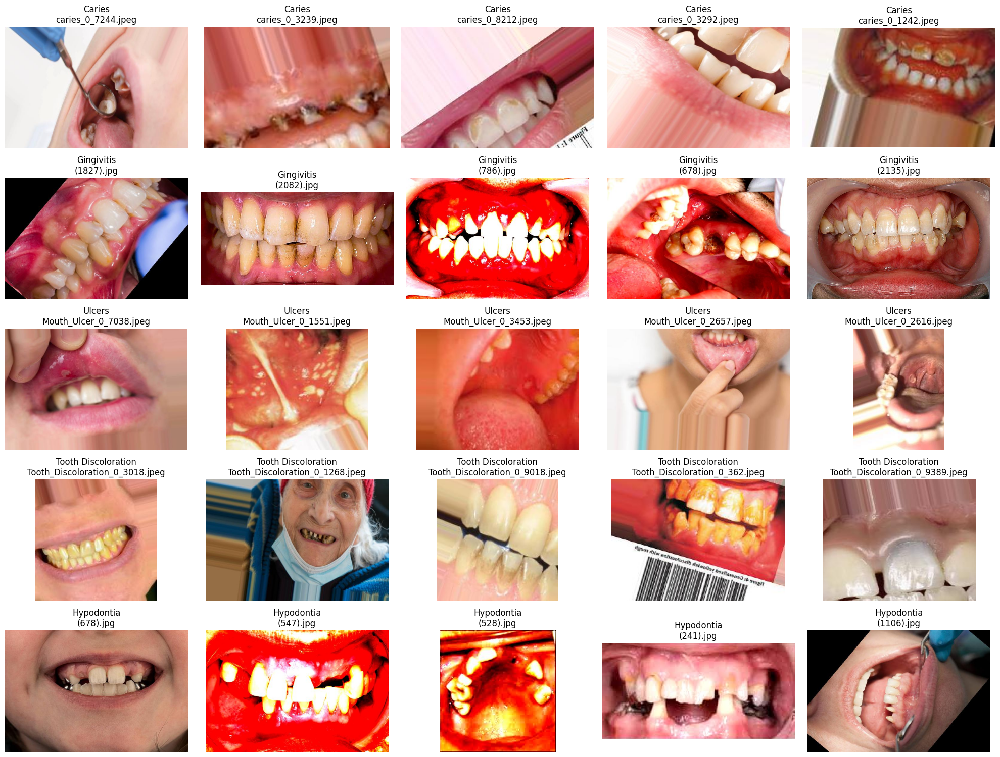

Number of images per class:

Caries:
  Train: 1714
  Val:   429
  Test:  239

Gingivitis:
  Train: 1684
  Val:   422
  Test:  234

Ulcers:
  Train: 1828
  Val:   458
  Test:  255

Tooth Discoloration:
  Train: 1320
  Val:   330
  Test:  184

Hypodontia:
  Train: 245
  Val:   62
  Test:  35


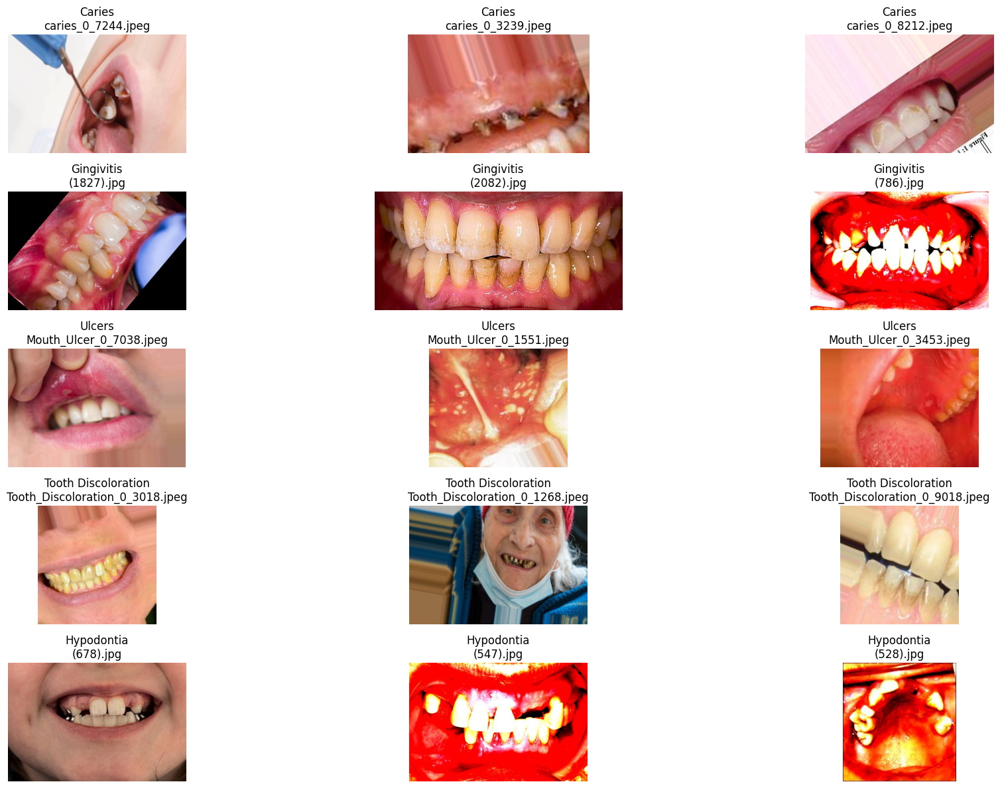

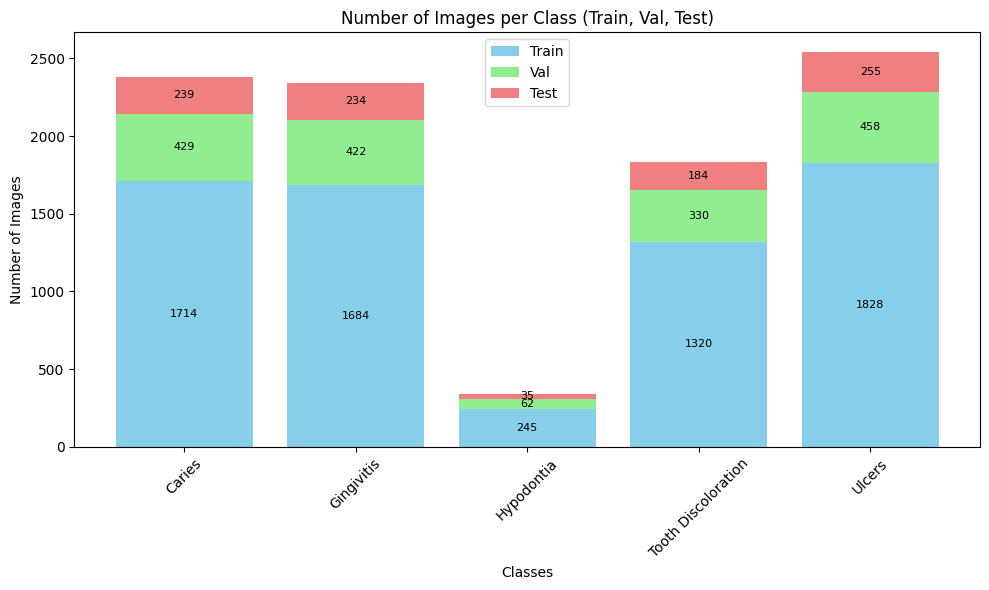

Classes in train_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Classes in val_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Classes in test_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
**************************************************
Number of training samples: 6791
Number of validation samples: 1701
Number of testing samples: 947


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 84.6MB/s]


Epoch 01/50 | Train Loss: 0.1124 | Train Acc: 67.28% | Val Loss: 0.0310 | Val Acc: 88.77%
Validation loss decreased (inf --> 0.031026). Saving model...
Epoch 02/50 | Train Loss: 0.0424 | Train Acc: 85.64% | Val Loss: 0.0151 | Val Acc: 93.89%
Validation loss decreased (0.031026 --> 0.015106). Saving model...
Epoch 03/50 | Train Loss: 0.0253 | Train Acc: 90.86% | Val Loss: 0.0079 | Val Acc: 95.83%
Validation loss decreased (0.015106 --> 0.007944). Saving model...
Epoch 04/50 | Train Loss: 0.0159 | Train Acc: 94.30% | Val Loss: 0.0056 | Val Acc: 97.71%
Validation loss decreased (0.007944 --> 0.005574). Saving model...
Epoch 05/50 | Train Loss: 0.0111 | Train Acc: 96.02% | Val Loss: 0.0051 | Val Acc: 97.88%
Validation loss decreased (0.005574 --> 0.005101). Saving model...
Epoch 06/50 | Train Loss: 0.0111 | Train Acc: 96.48% | Val Loss: 0.0050 | Val Acc: 98.12%
Validation loss decreased (0.005101 --> 0.004962). Saving model...
Epoch 07/50 | Train Loss: 0.0083 | Train Acc: 97.17% | Val Loss

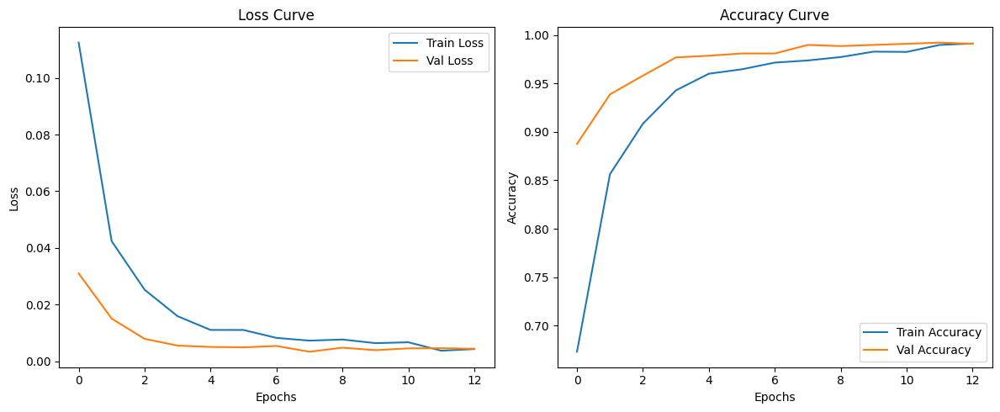

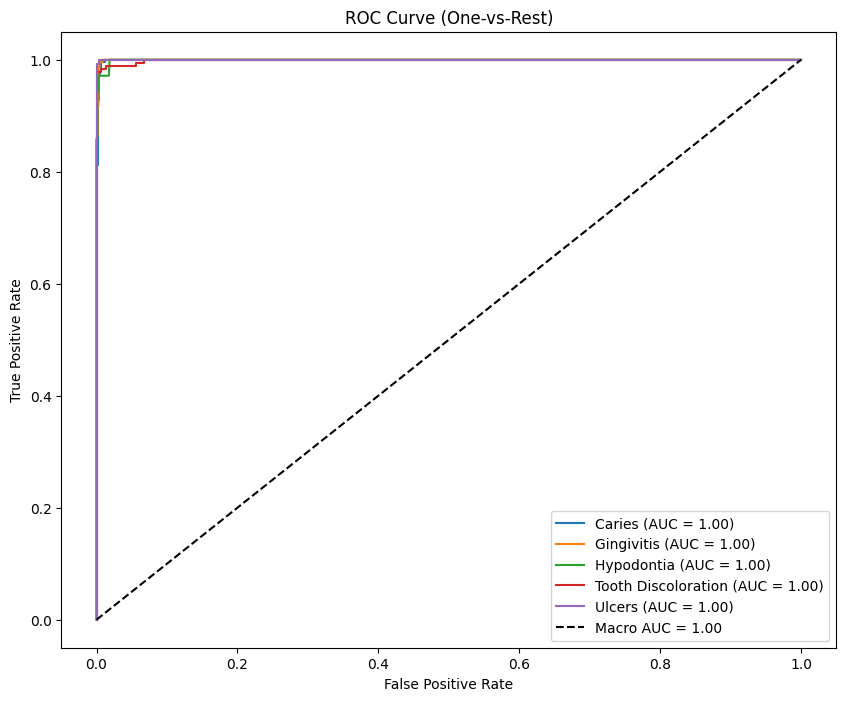

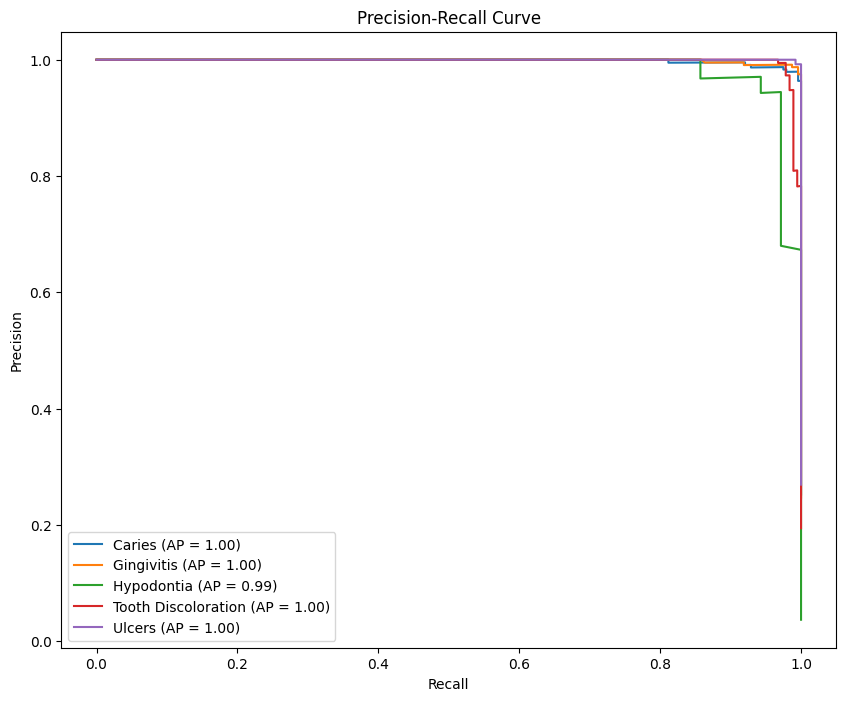

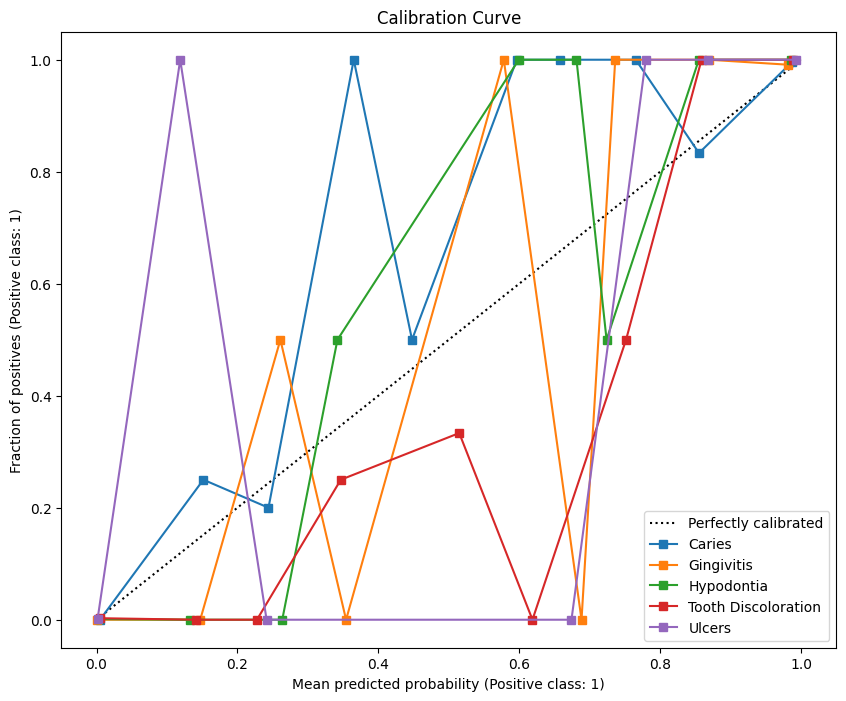

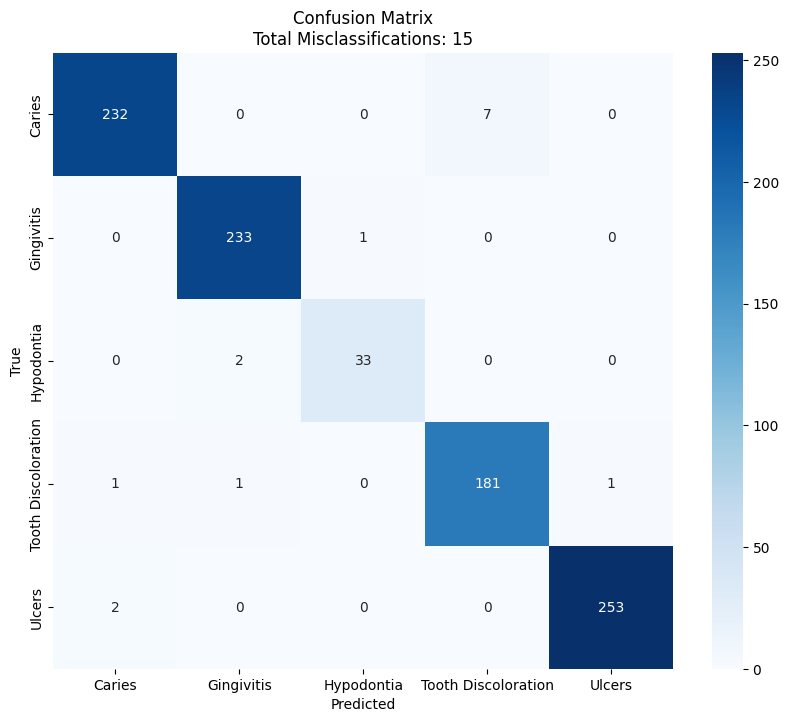

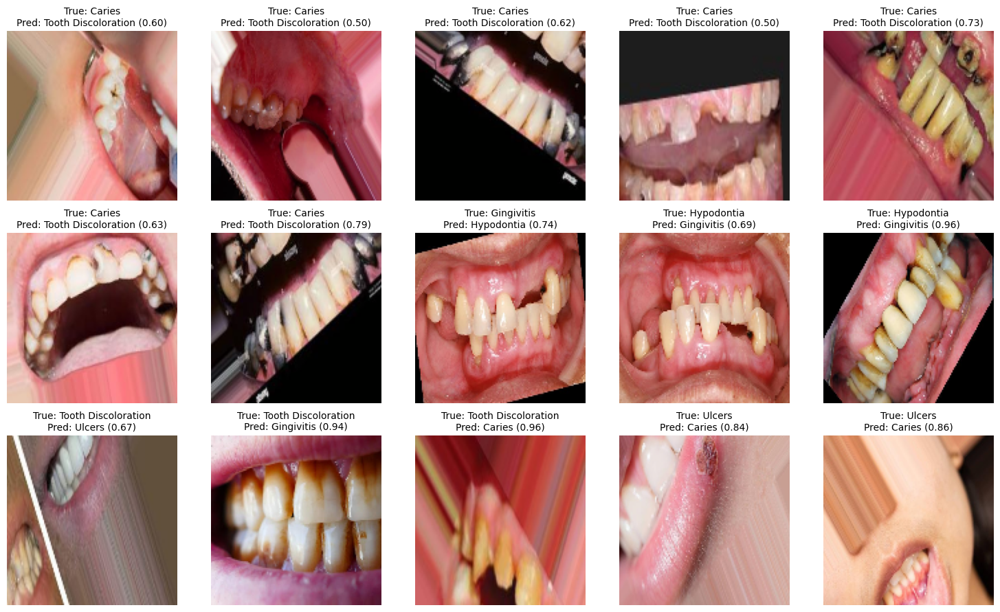

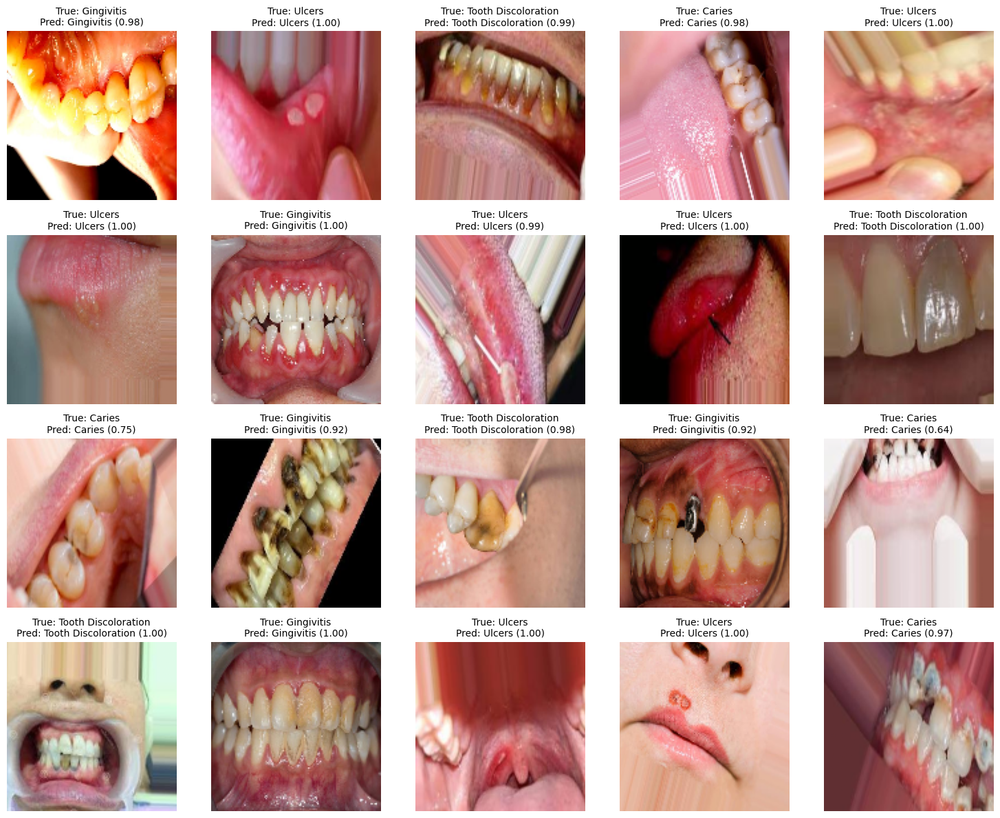

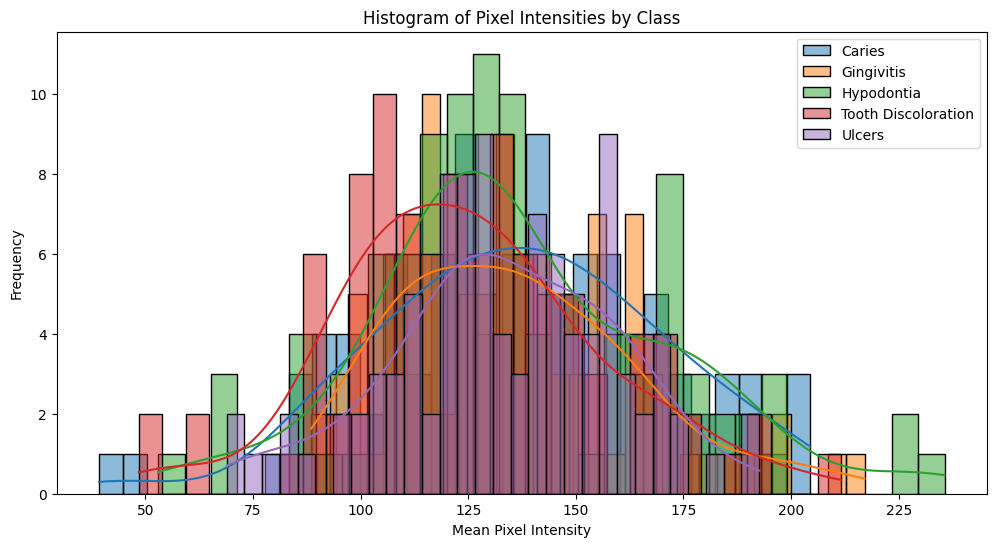

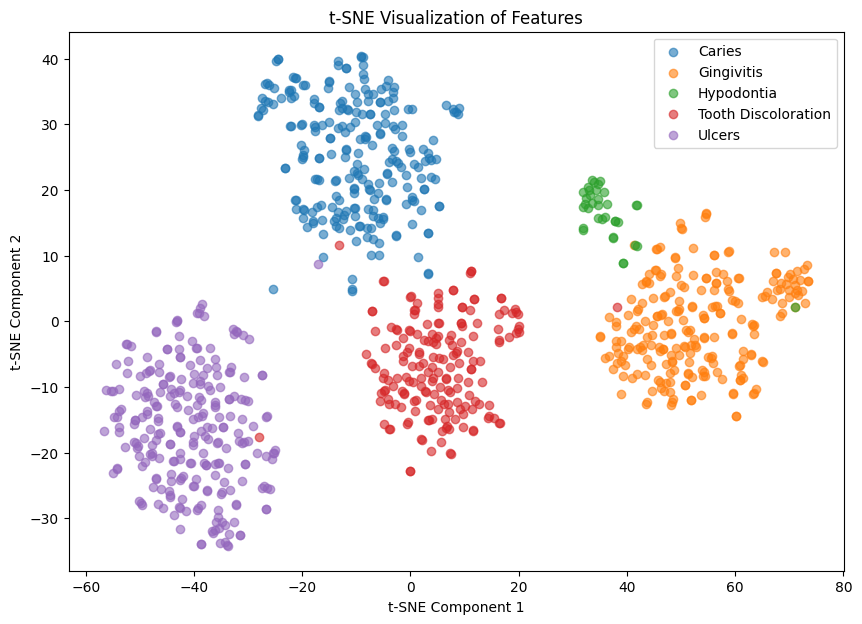


=== Evaluation Summary ===
Accuracy: 0.9842
Precision: 0.9843
Recall: 0.9842
F1-Score: 0.9842
Cohen's Kappa: 0.9793
MCC: 0.9793
Log Loss: 0.0501

=== Classification Report ===
                     precision    recall  f1-score   support

             Caries       0.99      0.97      0.98       239
         Gingivitis       0.99      1.00      0.99       234
         Hypodontia       0.97      0.94      0.96        35
Tooth Discoloration       0.96      0.98      0.97       184
             Ulcers       1.00      0.99      0.99       255

           accuracy                           0.98       947
          macro avg       0.98      0.98      0.98       947
       weighted avg       0.98      0.98      0.98       947



In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("salmansajid05/oral-diseases")

print("Path to dataset files:", path)

import os

dataset_path = "/root/.cache/kagglehub/datasets/salmansajid05/oral-diseases/versions/3"

for root, dirs, files in os.walk(dataset_path):
    print(f"Directory: {root}")
    print(f"Subdirectories: {dirs}")
    print(f"Files: {files[:5]}")  # Show first 5 files in each directory
    print("-" * 50)
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import precision_recall_curve, average_precision_score

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
from torchvision.models import resnet18

import os
import shutil
from sklearn.model_selection import train_test_split

original_dirs = {
    'Caries': '/kaggle/input/oral-diseases/Data caries/Data caries/caries augmented data set/preview',
    'Gingivitis': '/kaggle/input/oral-diseases/Gingivitis/Gingivitis',
    'Ulcers': '/kaggle/input/oral-diseases/Mouth Ulcer/Mouth Ulcer/Mouth_Ulcer_augmented_DataSet/preview',
    'Tooth Discoloration': '/kaggle/input/oral-diseases/Tooth Discoloration/Tooth Discoloration /Tooth_discoloration_augmented_dataser/preview',
    'Hypodontia': '/kaggle/input/oral-diseases/hypodontia/hypodontia'
}

base_dir = '/kaggle/working/dataset'

splits = ['train', 'val', 'test']
classes = list(original_dirs.keys())

for split in splits:
    for class_name in classes:
        os.makedirs(os.path.join(base_dir, split, class_name), exist_ok=True)

class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

def copy_and_count_images(class_name, image_paths):
    if not image_paths:
        print(f"No images found for class: {class_name}")
        return

    # Split the data
    train_paths, test_paths = train_test_split(image_paths, test_size=0.1, random_state=42)
    train_paths, val_paths = train_test_split(train_paths, test_size=0.2, random_state=42)  # 0.2 * 0.9 = 0.18

    # Check for empty splits
    if not train_paths or not val_paths or not test_paths:
        print(f"Warning: Empty split for {class_name}")
        return

    # Define split mappings
    split_paths = {
        'train': train_paths,
        'val': val_paths,
        'test': test_paths
    }

    # Copy images to their respective directories and count them
    for split, paths in split_paths.items():
        class_split_counts[class_name][split] = len(paths)
        for img_path in paths:
            target_path = os.path.join(base_dir, split, class_name, os.path.basename(img_path))
            shutil.copy(img_path, target_path)

# Traverse the original directories and gather image paths
# This part should not be indented as it is outside the function
for class_name, original_dir in original_dirs.items():
    if not os.path.exists(original_dir):
        print(f"{class_name}: Directory not found - {original_dir}")
        continue

    image_paths = []
    for root, dirs, files in os.walk(original_dir):
        image_paths.extend([os.path.join(root, file) for file in files if file.endswith(('.jpg', '.jpeg', '.png'))])

    print(f"{class_name}: Found {len(image_paths)} images.")
    if image_paths:
        copy_and_count_images(class_name, image_paths)

print("\nImages have been copied and organized successfully.")
print("\nNumber of images per class:")
for class_name, counts in class_split_counts.items():
    print(f"\n{class_name}:")
    print(f"  Train: {counts['train']}")
    print(f"  Val:   {counts['val']}")
    print(f"  Test:  {counts['test']}")

import matplotlib.pyplot as plt
import os

# Define the base directory where the dataset is organized
base_dir = '/kaggle/working/dataset'

# Define the classes
classes = [ 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# Set up the plot
plt.figure(figsize=(20, 15))
num_samples = 5  # Number of images to display per class

# Loop through each class and display 5 images
for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, 'train', class_name)  # Use the 'train' split
    image_files = os.listdir(class_path)[:num_samples]  # Get the first 5 images

    for img_idx, img_file in enumerate(image_files):
        img_path = os.path.join(class_path, img_file)
        img = plt.imread(img_path)

        # Plot the image
        plt.subplot(len(classes), num_samples, class_idx * num_samples + img_idx + 1)
        plt.imshow(img)
        plt.title(f"{class_name}\n{img_file}")
        plt.axis('off')

plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt
import numpy as np

# Print the distribution of images per class and split
print("Number of images per class:")
for class_name, counts in class_split_counts.items():
    print(f"\n{class_name}:")
    print(f"  Train: {counts['train']}")
    print(f"  Val:   {counts['val']}")
    print(f"  Test:  {counts['test']}")

# Visualize sample images from each class
plt.figure(figsize=(20, 12))
splits_to_show = ['train', 'val', 'test']
num_samples = 3  # Number of samples to show per class

for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, 'train', class_name)
    image_files = os.listdir(class_path)[:num_samples]  # Get first 3 images

    for img_idx, img_file in enumerate(image_files):
        img_path = os.path.join(class_path, img_file)
        img = plt.imread(img_path)

        plt.subplot(len(classes), num_samples, class_idx * num_samples + img_idx + 1)
        plt.imshow(img)
        plt.title(f"{class_name}\n{img_file}")
        plt.axis('off')

plt.tight_layout()
plt.show()

import os
import matplotlib.pyplot as plt

# Define class labels without 'Calculus'
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

# Define base directory
base_dir = '/kaggle/working/dataset'  # Update this path

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to count images in each split
def count_images(base_dir, class_name):
    counts = {}
    for split in ['train', 'val', 'test']:
        split_dir = os.path.join(base_dir, split, class_name)
        if os.path.exists(split_dir):  # Check if directory exists
            counts[split] = len(os.listdir(split_dir))
        else:
            counts[split] = 0
    return counts

# Calculate counts for each class and split
for class_name in classes:
    class_split_counts[class_name] = count_images(base_dir, class_name)

# Create lists for the bar plot
labels = classes
train_counts = [class_split_counts[class_name]['train'] for class_name in classes]
val_counts = [class_split_counts[class_name]['val'] for class_name in classes]
test_counts = [class_split_counts[class_name]['test'] for class_name in classes]

x = range(len(classes))

# Create the stacked bar plot
fig, ax = plt.subplots(figsize=(10, 6))

bar1 = ax.bar(x, train_counts, label='Train', color='skyblue')
bar2 = ax.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
bar3 = ax.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')

ax.set_xlabel('Classes')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Images per Class (Train, Val, Test)')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend()

# Add data labels with corrected positions
for bar in bar1:
    height = bar.get_height()
    if height > 0:  # Only label if height is greater than 0
        ax.text(bar.get_x() + bar.get_width()/2, height / 2, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar2:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar3:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

plt.tight_layout()
plt.show()
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms

# Define directories
base_dir = '/kaggle/working/dataset'  # Update this path
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Parameters
image_size = (128, 128)
batch_size = 16
num_epochs = 10

# Define class labels without 'Calculus'
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

# Data augmentation and normalization for training
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(image_size, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Normalization for validation and testing
val_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Custom dataset class to exclude
class MedicalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform

        self.classes = [cls for cls in os.listdir(data_dir) if cls != 'Calculus']
        self.classes = sorted(self.classes, key=lambda x: classes.index(x))
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}
        self.samples = self._make_dataset()

    def _make_dataset(self):
        samples = []
        for cls in self.classes:
            cls_dir = os.path.join(self.data_dir, cls)
            for img_name in os.listdir(cls_dir):
                samples.append((os.path.join(cls_dir, img_name), self.class_to_idx[cls]))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# Load datasets using the custom MedicalDataset
train_dataset = MedicalDataset(train_dir, transform=train_transforms)
val_dataset = MedicalDataset(val_dir, transform=val_transforms)
test_dataset = MedicalDataset(test_dir, transform=val_transforms)

# Create data loaders with reduced num_workers
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# Assuming train_loader, val_loader, and test_loader are already defined

# Extract classes from train_loader
train_classes = train_loader.dataset.classes
print("Classes in train_loader:", train_classes)

# Extract classes from val_loader
val_classes = val_loader.dataset.classes
print("Classes in val_loader:", val_classes)

# Extract classes from test_loader
test_classes = test_loader.dataset.classes
print("Classes in test_loader:", test_classes)

print('*'*50)


# Extract the number of samples from train_loader
num_train_samples = len(train_loader.dataset)

# Print the result
print("Number of training samples:", num_train_samples)

# Extract the number of samples from train_loader
num_val_samples = len(val_loader.dataset)

# Print the result
print("Number of validation samples:", num_val_samples)

# Extract the number of samples from train_loader
num_test_samples = len(test_loader.dataset)

# Print the result
print("Number of testing samples:", num_test_samples)

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import densenet121, DenseNet121_Weights
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.amp import GradScaler, autocast
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from sklearn.metrics import (
    confusion_matrix, precision_score, recall_score, f1_score, roc_curve, auc,
    roc_auc_score, precision_recall_curve, cohen_kappa_score, matthews_corrcoef,
    accuracy_score, classification_report, log_loss, average_precision_score
)
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from scipy.stats import chi2_contingency
from sklearn.utils import resample
import seaborn as sns
import random

EPOCHS = 50
EARLY_STOPPING_PATIENCE = 5
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
n_classes = len(classes)

class MedicalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.classes = [cls for cls in os.listdir(data_dir) if cls in classes]
        self.classes = sorted(self.classes, key=lambda x: classes.index(x))
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}
        self.samples = self._make_dataset()

    def _make_dataset(self):
        samples = []
        for cls in self.classes:
            cls_dir = os.path.join(self.data_dir, cls)
            for img_name in os.listdir(cls_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    samples.append((os.path.join(cls_dir, img_name), self.class_to_idx[cls]))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = np.array(Image.open(img_path).convert('RGB'))
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        return image, label

train_transform = A.Compose([
    A.Resize(128, 128),
    A.Rotate(limit=15),
    A.HorizontalFlip(),
    A.VerticalFlip(),
    A.CLAHE(clip_limit=2.0),
    A.ElasticTransform(alpha=1, sigma=50, p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(128, 128),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.key = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.value = nn.Conv2d(in_channels, in_channels, 1)
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        B, C, H, W = x.shape
        proj_query = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        proj_key = self.key(x).view(B, -1, H * W)
        energy = torch.bmm(proj_query, proj_key)
        attention = torch.softmax(energy, dim=-1)
        proj_value = self.value(x).view(B, -1, H * W)
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(B, C, H, W)
        return self.gamma * out + x

class MultiDentNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        base = densenet121(weights=DenseNet121_Weights.DEFAULT)
        self.features = nn.Sequential(
            base.features.conv0,
            base.features.norm0,
            base.features.relu0,
            base.features.pool0,
            base.features.denseblock1,
            base.features.transition1,
            SelfAttention(128),
            base.features.denseblock2,
            base.features.transition2,
            SelfAttention(256),
            base.features.denseblock3,
            base.features.transition3,
            SelfAttention(512),
            base.features.denseblock4,
            nn.AdaptiveAvgPool2d(1)
        )
        self.classifier = nn.Sequential(
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.7),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.6),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.features(x)
        flattened = features.view(features.size(0), -1)
        return self.classifier(flattened)

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce_loss)
        loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return loss.mean()

def clip_gradients(model, max_norm=1.0):
    torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)
def denormalize(image_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image = image_tensor * std + mean
    image = image.clamp(0, 1)
    return image.permute(1, 2, 0).numpy()

def validate_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    running_correct = 0
    labels_list = []
    preds_list = []
    probs_list = []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_correct += (preds == labels).sum().item()
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probabilities = torch.softmax(outputs, dim=1)
            probs_list.extend(probabilities.cpu().numpy())
    epoch_loss = running_loss / len(loader.dataset)
    epoch_acc = running_correct / len(loader.dataset)
    return epoch_loss, epoch_acc, np.array(labels_list), np.array(preds_list), None, np.array(probs_list)

def extract_features(model, loader, device):
    model.eval()
    features_list = []
    labels_list = []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(device)
            feats = model.features(inputs)
            feats = feats.view(feats.size(0), -1)
            features_list.append(feats.cpu().numpy())
            labels_list.append(labels.cpu().numpy())
    features = np.concatenate(features_list, axis=0)
    labels = np.concatenate(labels_list, axis=0)
    return features, labels

def plot_roc(test_true, test_probs):
    plt.figure(figsize=(10, 8))
    y_bin = label_binarize(test_true, classes=np.arange(n_classes))
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_bin[:, i], test_probs[:, i])
        roc_auc = roc_auc_score(y_bin[:, i], test_probs[:, i])
        plt.plot(fpr, tpr, label=f'{classes[i]} (AUC = {roc_auc:.2f})')
    macro_auc = roc_auc_score(y_bin, test_probs, multi_class="ovo", average="macro")
    plt.plot([0, 1], [0, 1], 'k--', label=f'Macro AUC = {macro_auc:.2f}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (One-vs-Rest)')
    plt.legend()
    plt.show()
def plot_prc(test_true, test_probs):
    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        precision, recall, _ = precision_recall_curve(test_true == i, test_probs[:, i])
        ap = average_precision_score(test_true == i, test_probs[:, i])
        plt.plot(recall, precision, label=f'{classes[i]} (AP = {ap:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.show()

def plot_calibration(test_true, test_probs):
    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        from sklearn.calibration import CalibrationDisplay
        CalibrationDisplay.from_predictions(
            (test_true == i).astype(int),
            test_probs[:, i],
            n_bins=10,
            name=classes[i],
            ax=plt.gca()
        )
    plt.title('Calibration Curve')
    plt.show()

def plot_cm(test_true, test_preds):
    cm = confusion_matrix(test_true, test_preds)
    total_errors = np.sum(cm) - np.trace(cm)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.title(f'Confusion Matrix\nTotal Misclassifications: {total_errors}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def plot_misclassified_images(test_dataset, test_true, test_preds, test_probs, classes, num_cols=5):
    misclassified_idx = np.where(test_true != test_preds)[0]
    num_misclassified = len(misclassified_idx)
    if num_misclassified == 0:
        print("No misclassified samples to display.")
        return

    num_rows = (num_misclassified + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * num_rows))
    for i, idx in enumerate(misclassified_idx):
        image_tensor, _ = test_dataset[idx]
        image = denormalize(image_tensor)
        true_label = test_true[idx]
        pred_label = test_preds[idx]
        confidence = test_probs[idx, pred_label]
        true_class = classes[true_label]
        pred_class = classes[pred_label]

        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_class}\nPred: {pred_class} ({confidence:.2f})", fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('misclassified_images.png')
    plt.show()

def plot_correctly_classified_images(test_dataset, test_true, test_preds, test_probs, classes, n=20, num_cols=5):
    correctly_classified_idx = np.where(test_true == test_preds)[0]
    if len(correctly_classified_idx) < n:
        print(f"Only {len(correctly_classified_idx)} correctly classified samples available. Adjusting n.")
        n = len(correctly_classified_idx)

    selected_idx = random.sample(list(correctly_classified_idx), n)
    num_rows = (n + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * num_rows))
    for i, idx in enumerate(selected_idx):
        image_tensor, _ = test_dataset[idx]
        image = denormalize(image_tensor)
        true_label = test_true[idx]
        pred_label = test_preds[idx]
        confidence = test_probs[idx, pred_label]
        true_class = classes[true_label]
        pred_class = classes[pred_label]

        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_class}\nPred: {pred_class} ({confidence:.2f})", fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('correctly_classified_images.png')
    plt.show()

class EarlyStopping:
    def __init__(self, patience=5, verbose=False, delta=0, path='checkpoint.pt'):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float('inf')
        self.delta = delta
        self.path = path

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

def main():
    # ---- Data Setup ----
    base_dir = '/kaggle/working/dataset'
    train_dir = os.path.join(base_dir, 'train')
    val_dir = os.path.join(base_dir, 'val')
    test_dir = os.path.join(base_dir, 'test')

    os.makedirs('/content/gdrive/MyDrive/MedicalPaper', exist_ok=True)

    train_dataset = MedicalDataset(train_dir, transform=train_transform)
    val_dataset = MedicalDataset(val_dir, transform=val_transform)
    test_dataset = MedicalDataset(test_dir, transform=val_transform)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

    # ---- Model Setup ----
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = MultiDentNet(num_classes=n_classes).to(device)

    # ---- Training Components ----
    criterion = FocalLoss()
    optimizer = optim.AdamW([
        {'params': model.features.parameters(), 'lr': 1e-4},
        {'params': model.classifier.parameters(), 'lr': 5e-4}
    ], weight_decay=1e-4)
    scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.2, patience=2)
    scaler = GradScaler()

    early_stopping = EarlyStopping(
        patience=EARLY_STOPPING_PATIENCE,
        verbose=True,
        path='/content/gdrive/MyDrive/MedicalPaper/best_model.pth'
    )

    # ---- Training Loop ----
    train_loss_history = []
    val_loss_history = []
    train_acc_history = []
    val_acc_history = []

    for epoch in range(EPOCHS):
        model.train()
        running_loss = 0.0
        running_correct = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            with autocast(device_type=device.type):
                outputs = model(inputs)
                loss = criterion(outputs, labels)
            scaler.scale(loss).backward()
            clip_gradients(model)
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_correct += (preds == labels).sum().item()

        train_epoch_loss = running_loss / len(train_dataset)
        train_epoch_acc = running_correct / len(train_dataset)
        train_loss_history.append(train_epoch_loss)
        train_acc_history.append(train_epoch_acc)

        val_epoch_loss, val_epoch_acc, _, _, _, _ = validate_epoch(model, val_loader, criterion, device)
        val_loss_history.append(val_epoch_loss)
        val_acc_history.append(val_epoch_acc)

        print(f"Epoch {epoch+1:02d}/{EPOCHS} | "
              f"Train Loss: {train_epoch_loss:.4f} | Train Acc: {train_epoch_acc:.2%} | "
              f"Val Loss: {val_epoch_loss:.4f} | Val Acc: {val_epoch_acc:.2%}")

        scheduler.step(val_epoch_loss)
        early_stopping(val_epoch_loss, model)
        if early_stopping.early_stop:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

    # ---- Final Evaluation ----
    print("\nTraining complete. Loading best model for evaluation...")
    model.load_state_dict(torch.load('/content/gdrive/MyDrive/MedicalPaper/best_model.pth', map_location=device))
    test_loss, test_acc, test_true, test_preds, _, test_probs = validate_epoch(model, test_loader, criterion, device)

    print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.2%}")

    # ---- Learning Curves ----
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_loss_history, label='Train Loss')
    plt.plot(val_loss_history, label='Val Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(train_acc_history, label='Train Accuracy')
    plt.plot(val_acc_history, label='Val Accuracy')
    plt.title('Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.tight_layout()
    plt.savefig('learning_curves.png')
    plt.show()

    # ---- Visualizations ----
    plot_roc(test_true, test_probs)
    plot_prc(test_true, test_probs)
    plot_calibration(test_true, test_probs)
    plot_cm(test_true, test_preds)

    # ---- Plot All Misclassified Images ----
    plot_misclassified_images(test_dataset, test_true, test_preds, test_probs, classes)

    # ---- Plot n=20 Correctly Classified Images ----
    plot_correctly_classified_images(test_dataset, test_true, test_preds, test_probs, classes, n=20)

    # ---- Additional Visualizations ----
    plt.figure(figsize=(12, 6))
    for i, cls in enumerate(classes):
        class_images = [img_path for img_path, label in train_dataset.samples
                        if label == train_dataset.class_to_idx[cls]]
        if class_images:
            intensities = [np.mean(np.array(Image.open(img).convert('L'))) for img in class_images[:100]]
            sns.histplot(intensities, bins=30, kde=True, label=cls)
    plt.title('Histogram of Pixel Intensities by Class')
    plt.xlabel('Mean Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

    features, test_labels = extract_features(model, test_loader, device)
    tsne = TSNE(n_components=2, random_state=42)
    features_2d = tsne.fit_transform(features)
    plt.figure(figsize=(10, 7))
    for i, cls in enumerate(classes):
        plt.scatter(features_2d[test_labels == i, 0], features_2d[test_labels == i, 1],
                    label=cls, alpha=0.6)
    plt.title('t-SNE Visualization of Features')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.legend()
    plt.show()

    # ---- Metrics ----
    accuracy_val = accuracy_score(test_true, test_preds)
    precision_val = precision_score(test_true, test_preds, average='weighted')
    recall_val = recall_score(test_true, test_preds, average='weighted')
    f1_val = f1_score(test_true, test_preds, average='weighted')
    kappa = cohen_kappa_score(test_true, test_preds)
    mcc = matthews_corrcoef(test_true, test_preds)
    logloss = log_loss(test_true, test_probs)

    print("\n=== Evaluation Summary ===")
    print(f"Accuracy: {accuracy_val:.4f}")
    print(f"Precision: {precision_val:.4f}")
    print(f"Recall: {recall_val:.4f}")
    print(f"F1-Score: {f1_val:.4f}")
    print(f"Cohen's Kappa: {kappa:.4f}")
    print(f"MCC: {mcc:.4f}")
    print(f"Log Loss: {logloss:.4f}")
    print("\n=== Classification Report ===")
    print(classification_report(test_true, test_preds, target_names=classes))

if __name__ == "__main__":
    main()

# NLP part

In [5]:
# prompt: Install faiss

!pip install faiss-cpu



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 29.6 MB/s eta 0:00:00


In [6]:
# 2. Load the dataset
import pandas as pd
from sentence_transformers import SentenceTransformer, util


# Import pandas
import pandas as pd

# Load the dataset directly from GitHub
url = "https://raw.githubusercontent.com/LinesHogan/Open-Domain-Oral-Disease-QA-Dataset/main/ODOD-SFT.jsonl"
df = pd.read_json(url, lines=True)

# View the first few rows
df.head()

# Initialize sentence embedding model
model = SentenceTransformer("all-MiniLM-L6-v2")
questions = df['query'].tolist()
answers = df['response'].tolist()

# Embed all questions
question_embeddings = model.encode(questions, convert_to_tensor=True)

# Define a chatbot function
def chatbot(user_input):
    input_embedding = model.encode(user_input, convert_to_tensor=True)
    scores = util.cos_sim(input_embedding, question_embeddings)[0]
    best_match = scores.argmax().item()
    print("🤖:", answers[best_match])
# Example
chatbot("My gums are swollen and red, what could it be?")


from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSeq2SeqLM,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    DataCollatorForSeq2Seq
)

# Only keep question-answer pairs
# Rename columns to match T5 input expectations
hf_data = Dataset.from_pandas(df[["query", "response"]].rename(columns={"query": "question", "response": "answer"}))
hf_data = hf_data.train_test_split(test_size=0.1)

# Load T5 tokenizer and model
model_name = "t5-small"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSeq2SeqLM.from_pretrained(model_name)

# Tokenize dataset
def preprocess(batch):
    inputs = ["question: " + q for q in batch["question"]]
    outputs = batch["answer"]
    return tokenizer(inputs, text_target=outputs, truncation=True, padding="max_length", max_length=512)




tokenized_data = hf_data.map(preprocess, batched=True)

training_args = Seq2SeqTrainingArguments(
    output_dir="./t5_qa_model",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    learning_rate=2e-5,
    weight_decay=0.01,
    num_train_epochs=10,
    logging_dir="./logs",
    fp16=True
)


trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_data["train"],
    eval_dataset=tokenized_data["test"],
    tokenizer=tokenizer,
    data_collator=DataCollatorForSeq2Seq(tokenizer, model=model),
)

# Start training
trainer.train()

model.save_pretrained("./t5_qa_model")
tokenizer.save_pretrained("./t5_qa_model")
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, Seq2SeqTrainer

# After you finish training your model with Seq2SeqTrainer, save both model and tokenizer:
# (Run this **after training**, once)
trainer.save_model("./t5_qa_model")          # saves model and config
tokenizer.save_pretrained("./t5_qa_model")   # saves tokenizer files

# -----------------------------------------------------------
# Now, to load the fine-tuned model and tokenizer for inference:

model_name_or_path = "./t5_qa_model"  # directory where model and tokenizer are saved

# Load tokenizer and model from the saved directory
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path)
model = AutoModelForSeq2SeqLM.from_pretrained(model_name_or_path)

def answer_question(question):
    input_text = "question: " + question
    inputs = tokenizer(input_text, return_tensors="pt", truncation=True, padding=True)
    outputs = model.generate(**inputs, max_length=64, num_beams=5, early_stopping=True)
    answer = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return answer

# Test example
test_question = "My gums are swollen and red, what could it be?"
print("Question:", test_question)
print("Answer:", answer_question(test_question))



import json
from sentence_transformers import SentenceTransformer, util
import faiss
import numpy as np
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch
# Load fine-tuned T5 model and tokenizer
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

model_path = "./t5_qa_model"  # local directory containing your saved model

tokenizer = AutoTokenizer.from_pretrained(model_path, local_files_only=True)
model = AutoModelForSeq2SeqLM.from_pretrained(model_path, local_files_only=True)

# Rename and format to fit RAG's passage format
corpus = []
for _, row in df.iterrows():
    corpus.append({
        "title": row["query"],  # dummy title (RAG expects one)
        "text": row["response"]  # actual context to retrieve
    })

# Save to disk
with open("corpus.json", "w") as f:
    json.dump(corpus, f)

from sentence_transformers import SentenceTransformer
import faiss
import numpy as np
import json

# Load the response texts
with open("corpus.json") as f:
    corpus = json.load(f)

texts = [doc["text"] for doc in corpus]

# Use a fast transformer model for vectorization
encoder = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = encoder.encode(texts, convert_to_numpy=True, show_progress_bar=True)

# Create FAISS index
dimension = embeddings.shape[1]
faiss_index = faiss.IndexFlatL2(dimension)
faiss_index.add(embeddings)

# Save for later use
faiss.write_index(faiss_index, "faiss_index.idx")
with open("corpus_texts.json", "w") as f:
    json.dump(texts, f)
class CustomRetriever:
    def __init__(self, encoder_model_name, index_path, corpus_path):
        self.encoder = SentenceTransformer(encoder_model_name)
        self.index = faiss.read_index(index_path)

        with open(corpus_path, "r") as f:
            self.corpus_texts = json.load(f)

        if isinstance(self.corpus_texts, dict):
            self.corpus_ids = list(self.corpus_texts.keys())
            self.text_lookup = self.corpus_texts
        else:
            self.corpus_ids = list(range(len(self.corpus_texts)))
            self.text_lookup = {str(i): text for i, text in enumerate(self.corpus_texts)}

    def retrieve(self, query, top_k=5):
        query_embedding = self.encoder.encode(query, convert_to_numpy=True)
        scores, indices = self.index.search(np.array([query_embedding]), top_k)
        return [self.corpus_texts[self.corpus_ids[i]] for i in indices[0]]
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

# --- Init your retriever ---
retriever = CustomRetriever(
    encoder_model_name="sentence-transformers/all-MiniLM-L6-v2",  # or your encoder
    index_path="faiss_index.idx",
    corpus_path="corpus_texts.json"
)

# --- RAG-like QA inference ---
def rag_answer(query):
    retrieved_contexts = retriever.retrieve(query)
    context = " ".join(retrieved_contexts)

    input_text = f"question: {query} context: {context}"
    inputs = tokenizer(input_text, return_tensors="pt", truncation=True, padding=True).to(model.device)

    with torch.no_grad():
        outputs = model.generate(**inputs, max_length=128, num_beams=4, early_stopping=True)

    return tokenizer.decode(outputs[0], skip_special_tokens=True)
# Example test
query = "My gums are swollen and red, what could it be?"
print("Q:", query)
print("A:", rag_answer(query))



/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

🤖: While I can't diagnose your condition as an AI developed by OpenAI, the symptoms you describe could suggest a few dental conditions.
1. Pericoronitis: This is a dental disorder in which the gum tissue around the wisdom teeth becomes swollen and infected. It's most common around partially erupted wisdom teeth, where the tooth has not surfaced fully and the gum has created a flap or pocket around the tooth where food and bacteria can get trapped. This can cause symptoms like swollen gums, pain, and bad breath.
2. Gingivitis or Periodontitis: These are stages of gum disease. Gingivitis is the milder, reversible form, while periodontitis is more serious and can lead to tooth loss. Both can cause swollen, tender gums and bad breath.
3. Tooth Decay or Abscess: A cavity or an abscessed tooth can also cause bad breath and swollen gums, especially if the decay or infection is near the gum line.
4. Poor Oral Hygiene: Not brushing and flossing regularly or correctly can lead to plaque buildup,

tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

Map:   0%|          | 0/431 [00:00<?, ? examples/s]

Map:   0%|          | 0/48 [00:00<?, ? examples/s]

<ipython-input-6-3769348634>:76: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: omarislam590 (omarislam590-british-university-in-egypt) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.48.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.


Step,Training Loss
500,3.139100


Question: My gums are swollen and red, what could it be?
Answer: swollen and red gums


Batches:   0%|          | 0/15 [00:00<?, ?it/s]

Q: My gums are swollen and red, what could it be?
A: swollen, red, or bleeding gums, loose teeth, and gaps between the teeth


# interface part

In [12]:
!pip install streamlit
!pip install pyngrok


In [32]:
%%writefile app.py
import streamlit as st
import torch
from PIL import Image
import numpy as np
import json
import faiss
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from sentence_transformers import SentenceTransformer

# === IMAGE CLASSIFICATION SETUP ===
@st.cache_resource
def load_image_model():
    class SelfAttention(nn.Module):
        def __init__(self, in_channels):
            super().__init__()
            self.query = nn.Conv2d(in_channels, in_channels // 8, 1)
            self.key = nn.Conv2d(in_channels, in_channels // 8, 1)
            self.value = nn.Conv2d(in_channels, in_channels, 1)
            self.gamma = nn.Parameter(torch.zeros(1))

        def forward(self, x):
            B, C, H, W = x.shape
            proj_query = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
            proj_key = self.key(x).view(B, -1, H * W)
            energy = torch.bmm(proj_query, proj_key)
            attention = torch.softmax(energy, dim=-1)
            proj_value = self.value(x).view(B, -1, H * W)
            out = torch.bmm(proj_value, attention.permute(0, 2, 1)).view(B, C, H, W)
            return self.gamma * out + x

    class MultiDentNet(nn.Module):
        def __init__(self, num_classes):
            super().__init__()
            base = torch.hub.load('pytorch/vision:v0.15.2', 'densenet121', pretrained=False)
            self.features = nn.Sequential(
                base.features.conv0,
                base.features.norm0,
                base.features.relu0,
                base.features.pool0,
                base.features.denseblock1,
                base.features.transition1,
                SelfAttention(128),
                base.features.denseblock2,
                base.features.transition2,
                SelfAttention(256),
                base.features.denseblock3,
                base.features.transition3,
                SelfAttention(512),
                base.features.denseblock4,
                nn.AdaptiveAvgPool2d(1)
            )
            self.classifier = nn.Sequential(
                nn.Linear(1024, 512),
                nn.BatchNorm1d(512),
                nn.ReLU(),
                nn.Dropout(0.7),
                nn.Linear(512, 256),
                nn.BatchNorm1d(256),
                nn.ReLU(),
                nn.Dropout(0.6),
                nn.Linear(256, num_classes)
            )

        def forward(self, x):
            x = self.features(x)
            x = torch.flatten(x, 1)
            return self.classifier(x)

    model = MultiDentNet(num_classes=5)
    model.load_state_dict(torch.load('best_model.pth', map_location=torch.device('cpu')))
    model.eval()
    return model

image_model = load_image_model()
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

def preprocess_image(image):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0)

# === NLP SETUP ===
@st.cache_resource
def load_nlp_components():
    class CustomRetriever:
      def __init__(self):
          self.encoder = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")
          self.index = faiss.read_index("faiss_index.idx")
          with open("corpus_texts.json", "r") as f:
              self.corpus = json.load(f)

      def retrieve(self, query, top_k=3):
          query_emb = self.encoder.encode([query], convert_to_tensor=True)
          scores, idxs = self.index.search(query_emb.cpu().numpy(), top_k)
          return [self.corpus[i] for i in idxs[0]]


    retriever = CustomRetriever()

    tokenizer = AutoTokenizer.from_pretrained("t5_qa_model")
    model = AutoModelForSeq2SeqLM.from_pretrained("t5_qa_model")
    return retriever, tokenizer, model

retriever, tokenizer, nlp_model = load_nlp_components()

# === APP LAYOUT ===
st.title("Oral Health Assistant 🦷")

tab1, tab2 = st.tabs(["Disease Detection", "Ask an Expert"])

with tab1:
    st.header("Classify Dental Images")
    uploaded_file = st.file_uploader("Upload an oral health image", type=["jpg", "jpeg", "png"])

    if uploaded_file is not None:
        image = Image.open(uploaded_file).convert("RGB")
        st.image(image, caption='Uploaded Image', use_column_width=True)

        if st.button("Analyze Image"):
            input_tensor = preprocess_image(image)
            with torch.no_grad():
                outputs = image_model(input_tensor)
            probabilities = torch.softmax(outputs, dim=1)[0]
            confidences = {cls: prob.item() for cls, prob in zip(classes, probabilities)}

            st.subheader("Prediction Results:")
            for cl, prob in confidences.items():
                st.write(f"- **{cl}**: {prob*100:.2f}%")
            st.success(f"Most likely: {max(confidences, key=confidences.get)}")

            # Add visualization of attention maps (if available)
            # (Implementation requires intermediate feature extraction)

with tab2:
    st.header("Ask a Dental Health Question")
    user_question = st.text_area("Enter your question:",
                                "What causes swollen gums?",
                                height=100)

    if st.button("Get Advice"):
        with st.spinner("Processing..."):
            # Retrieve context
            contexts = retriever.retrieve(user_question, top_k=3)
            context = " ".join(contexts)

            # Prepare input for T5
            input_text = f"question: {user_question} context: {context}"
            inputs = tokenizer(input_text, return_tensors="pt", truncation=True, padding=True)

            with torch.no_grad():
                outputs = nlp_model.generate(**inputs,
                                            max_length=256,
                                            num_beams=4,
                                            early_stopping=True)
            answer = tokenizer.decode(outputs[0], skip_special_tokens=True)

            st.subheader("Answer:")
            st.write(answer)
            st.warning("Always consult a dental professional for medical advice.")

st.markdown("Models trained on oral health datasets from Kaggle and Open-Source repositories.")
st.write("⚠️ Legal Disclaimer: This tool is for informational purposes only.")

Overwriting app.py


In [33]:
!ngrok config add-authtoken 2y4MeL1IzecMT7rxK4OJnT2X6Np_4zgvcM9fEkjZ15oD77QCT



Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [34]:
from pyngrok import ngrok
import os

# Set the port for Streamlit
port = 8501

# Run Streamlit in the background
os.system(f"streamlit run app.py &")

# Open an ngrok tunnel to the streamlit port
public_url = ngrok.connect(port)
print(f"🌐 Streamlit app available at: {public_url}")


🌐 Streamlit app available at: NgrokTunnel: "https://7d84-34-16-138-64.ngrok-free.app" -> "http://localhost:8501"


In [28]:
from pyngrok import ngrok

# Close all open tunnels
ngrok.kill()  # This resets the session
